# **Title: Predicting the Sex of Abalone**

**Group 26**: Joontae (Jay) Kim, Elisabeth Lau, Patricia Zhang, Jimmy Qi

## **Introduction**

We are using the Abalone dataset, originally created by Warwick Nash, Tracy Sellers, Simon Talbot, Andrew Cawthorn, and Wes Ford, from UC Irvine’s Machine Learning Repository
https://archive.ics.uci.edu/dataset/1/abalone 
The process of determining abalone age includes time-consuming processes where one must cut open the shell through the cone in a specific manner, stain it, and then count the number of rings the abalone possesses through a microscope. One can predict the age of the abalone using less time-consuming measurements such as weather patterns, location, and feeding patterns due to the abalone habitat (Nash et al., 1995).

**Project Question:** How can we use the size measurements, particularly length, diameter, height, and total weight, to help us effectively predict the sex of abalone?

This dataset includes variables of sex, length, diameter, height, number of rings, and the whole, shucked, viscera, and shell weight. The dataset also includes the observations role(feature/target), type(continuous/integer), description, units, and missing values(yes/no) of each variable. This dataset also uses a tabular delimiter, allowing tasks such as classification and regression to answer our question.

## **Preliminary exploratory data analysis**

In [3]:
#Import packages that we will use
library(tidyverse)
library(cowplot)
library(scales)
library(GGally)
library(ggplot2)
library(tidymodels)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Warning message:
“package ‘cowplot’ was built under R version 4.3.2”

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp



Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor


Warning message:
“package ‘GGally’ was built under R version 4.3.2”
Registered S3 method overwritten by 'GGally':
  method from   
  +.

In [4]:
#Download and import the table using URL
url <- "https://raw.githubusercontent.com/werehappy/DSCI-Group-Project-26-/main/data/abalone.data"
download.file(url, "abalone_data.csv")
abalone_data <- read_delim("abalone_data.csv", delim = ",")

Rows: 4176 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): M
dbl (8): 0.455, 0.365, 0.095, 0.514, 0.2245, 0.101, 0.15, 15

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [5]:
#Add column names to the table
colnames(abalone_data) <- c("Sex", "Length", "Diameter", 
                      "Height", "Whole_weight", "Shucked_weight", "Visera_weight", "Shell_weight", "Rings")
abalone_data

Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Visera_weight,Shell_weight,Rings
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7
I,0.425,0.300,0.095,0.3515,0.1410,0.0775,0.120,8
F,0.530,0.415,0.150,0.7775,0.2370,0.1415,0.330,20
F,0.545,0.425,0.125,0.7680,0.2940,0.1495,0.260,16
M,0.475,0.370,0.125,0.5095,0.2165,0.1125,0.165,9
F,0.550,0.440,0.150,0.8945,0.3145,0.1510,0.320,19


In [6]:
#Filter out unwanted variables and factorise Sex column
abalone_filtered_fct <- abalone_data |> mutate(Sex = as_factor(Sex)) |> 
mutate(Sex = fct_recode(Sex, "Male" = "M", "Female" = "F", "Infant" = "I")) |> select(Sex:Whole_weight)
abalone_filtered_fct

Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.350,0.265,0.090,0.2255
Female,0.530,0.420,0.135,0.6770
Male,0.440,0.365,0.125,0.5160
Infant,0.330,0.255,0.080,0.2050
Infant,0.425,0.300,0.095,0.3515
Female,0.530,0.415,0.150,0.7775
Female,0.545,0.425,0.125,0.7680
Male,0.475,0.370,0.125,0.5095
Female,0.550,0.440,0.150,0.8945


In [7]:
#Splitting the table with 75% of training and 25% of testing
abalone_split <- initial_split(abalone_filtered_fct, prop = 0.75, strata = Sex)
abalone_train <- training(abalone_split) #visualise!!
abalone_test <- testing(abalone_split)

abalone_train

Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Female,0.530,0.415,0.150,0.7775
Female,0.545,0.425,0.125,0.7680
Female,0.550,0.440,0.150,0.8945
Female,0.525,0.380,0.140,0.6065
Female,0.470,0.355,0.100,0.4755
Female,0.440,0.340,0.100,0.4510
Female,0.565,0.440,0.155,0.9395
Female,0.550,0.415,0.135,0.7635
Female,0.615,0.480,0.165,1.1615


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


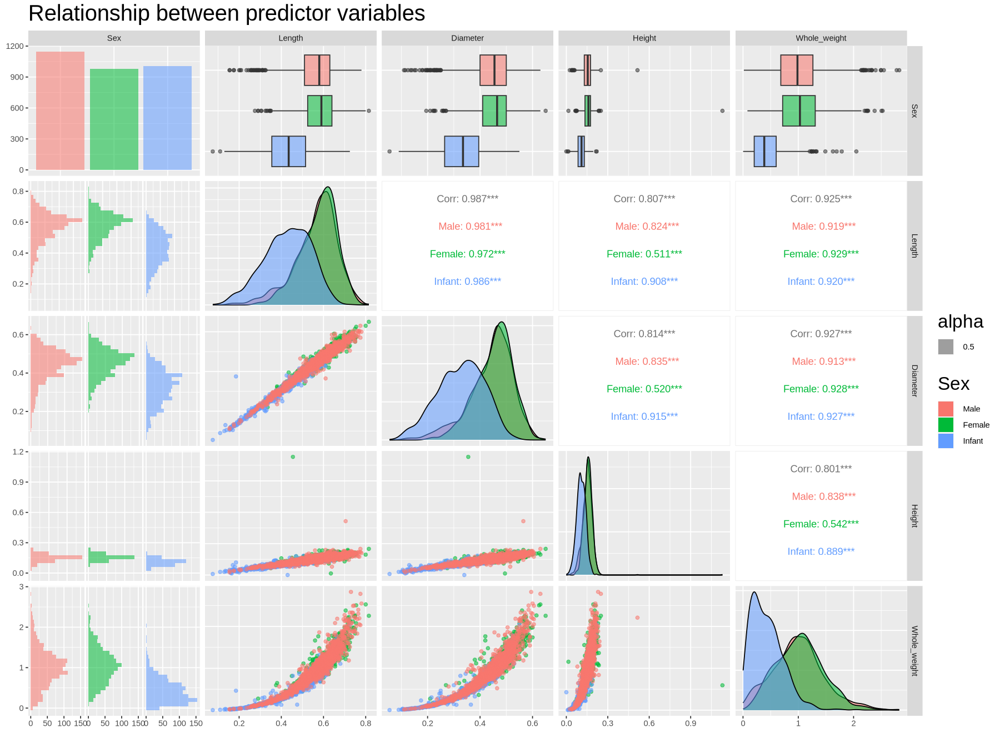

In [10]:
#Visualise the training data - exploratory analysis
options(repr.plot.width = 15, repr.plot.height = 11)
ggpairs(abalone_train, 
        columns = 1:5, 
        ggplot2::aes(color = Sex , alpha = 0.5),
        legend = 1,
        theme(legend.position = "bottom"),
        labs(fill = "Sex")) + 
    ggtitle("Relationship between predictor variables") +
    theme(title = element_text(size = 20))

In [7]:
#Summaries
length_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_length = mean(Length), median_length = median(Length), min_length = min(Length), max_length = max(Length))
length_summary

height_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_height = mean(Height), median_height = median(Height), min_height = min(Height), max_height = max(Height))
height_summary

diameter_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_diameter = mean(Diameter), median_diameter = median(Diameter), min_diameter = min(Diameter), max_diameter = max(Diameter))
diameter_summary

weight_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_weight = mean(Whole_weight), median_height = median(Whole_weight), min_weight = min(Whole_weight), max_weight = max(Whole_weight))
weight_summary

Sex,mean_length,median_length,min_length,max_length
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.5611310,0.580,0.155,0.780
Female,0.5789031,0.590,0.290,0.815
Infant,0.4267197,0.435,0.110,0.680


Sex,mean_height,median_height,min_height,max_height
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.1514498,0.155,0.040,0.515
Female,0.1586735,0.160,0.015,1.130
Infant,0.1080318,0.110,0.015,0.215


Sex,mean_diameter,median_diameter,min_diameter,max_diameter
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.4387293,0.455,0.11,0.63
Female,0.4544592,0.465,0.21,0.65
Infant,0.3257604,0.335,0.09,0.53


Sex,mean_weight,median_height,min_weight,max_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.9839808,0.9680,0.0155,2.8255
Female,1.0451561,1.0415,0.1485,2.5550
Infant,0.4305442,0.3825,0.0080,1.7860


## **Methods**

We will use the KNN classification model using the length, diameter, height, and whole weight variables as predictors to conduct our data analysis. Because these are all physical, quantitative characteristics of the abalone, they can be used to classify the categorical sex variable. We cannot use rings (which represent the age of the abalone) because it is a distinct aspect of abalone from sex; an older or younger abalone should not affect their sex. Other variables such as shucked weight, viscera weight, and shell weight were also not used because they are nondistinct and already contribute to the whole weight.

We can visualize the classification results by comparing the amount of correct predictions and incorrect predictions in a scatter plot.

To see the correlation between the variables we are using, we have used 2 different types of plots–area graphs and scatter plots. 
- Cross validation
- Model tuning
- Confusion matrices

We will visualize the classification results using a scatter plot to show the distribution of male versus female points, then predict unknown points using the k-nearest neighbours function.

**Expected outcomes and significance**

According to the article,  “Allometry for Sexual Size Dimorphism: Pattern and Process in the Coevolution of Body Size in Males and Females,”  researcher states that “female-biased sexual size dimorphism predominates among invertebrates and poikilothermic vertebrates”, and female organisms tend to be larger (D.J.Fairbairn, 1997). Therefore, we expect female abalone to be bigger compared to male organisms. 

Such findings regarding abalone size and sex can have a major impact on abalone conservation, as we will be able to predict the sex of abalone through physical measurements. Consequently, allowing a more efficient method of documenting abalone populations. For example, according to the article, “On the road to extinction? Population declines of the endangered white abalone, Haliotis sorenseni”, Kevin L. Stierhoff speaks of the low rate of reproduction within abalones. Consequently, conservation scientists need to be able to document the remaining number of male and female white abalones in a time-efficient manner.

One future question this could lead to would be “How to predict an infant abalone’s sex through its physical qualities?” This question would be an extension of our current question since infant abalones are not given sex in our dataset; therefore, it would be within reason for the next step of the research to be about determining the sex of infant abalones.

**References**

- Fairbairn, D. J. (1997). Allometry for Sexual Size Dimorphism: Pattern and Process in the Coevolution of Body Size in Males and Females. Annual Review of Ecology and Systematics, 28, 659–687. http://www.jstor.org/stable/2952508

- Stierhoff, K. L., Neuman, M., & Butler, J. L. (2012). On the road to extinction? population declines of the endangered white abalone, Haliotis sorenseni. Biological Conservation, 152, 46–52. https://doi.org/10.1016/j.biocon.2012.03.013 

- Nash, W., Sellers, T., Talbot, S., Cawthorn, A., and Ford, W. (1995). Abalone. UCI Machine Learning Repository. https://doi.org/10.24432/C55C7W.

- The Editors of Encyclopædia Britannica. (2015a). Sexual dimorphism. Encyclopædia Britannica. https://www.britannica.com/science/sexual-dimorphism 